In [1]:
import optuna
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import Lasso, ElasticNet
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor

plt.style.use('ggplot')

In [2]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 20

train = pd.read_csv('data/train.csv', index_col=0)
train['Dataset'] = 'train'

test = pd.read_csv('data/test.csv', index_col=0)
test['Dataset'] = 'test'

df = pd.concat([train, test])

df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Dataset
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0,train
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0,train
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0,train
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0,train
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0,train


### Dtypes
Let's start by recategorizing int/float features that are more similar to categorical.

In [3]:
df.nunique().sort_values(ascending=True)

CentralAir          2
Utilities           2
Alley               2
Street              2
Dataset             2
GarageFinish        3
PavedDrive          3
LandSlope           3
HalfBath            3
BsmtHalfBath        3
PoolQC              3
BsmtCond            4
MasVnrType          4
BsmtExposure        4
MiscFeature         4
Fence               4
ExterQual           4
BsmtFullBath        4
KitchenAbvGr        4
KitchenQual         4
LandContour         4
LotShape            4
BsmtQual            4
Electrical          5
FullBath            5
HeatingQC           5
FireplaceQu         5
YrSold              5
GarageQual          5
MSZoning            5
LotConfig           5
GarageCond          5
BldgType            5
ExterCond           5
Fireplaces          5
Foundation          6
SaleCondition       6
GarageType          6
Heating             6
RoofStyle           6
GarageCars          6
BsmtFinType1        6
BsmtFinType2        6
Functional          7
BedroomAbvGr        8
Condition2

We can assume a threshold to guarantee that a feature is categorical. From the above analysis and by reading the data description, I'll set this threshold as 16.

In [89]:
# cat_cols = df.columns[(df.nunique() <= 16).values]
# df.loc[:, cat_cols] = df.loc[:, cat_cols].astype('object')

In [4]:
data_types = df.dtypes
data_types.groupby(data_types).count()

int64      25
float64    12
object     44
dtype: int64

### Missing values

In [91]:
df.isnull().sum().sort_values(ascending = False).head(10)

PoolQC          2909
MiscFeature     2814
Alley           2721
Fence           2348
SalePrice       1459
FireplaceQu     1420
LotFrontage      486
GarageFinish     159
GarageYrBlt      159
GarageQual       159
dtype: int64

In [92]:
null_train = train.isnull().sum()
null_test = test.isnull().sum()
null_train = null_train.drop('SalePrice')
null_train.compare(null_test).sort_values(['self','other'], ascending= [False,False])

,self,other
PoolQC,1453.0,1456.0
MiscFeature,1406.0,1408.0
Alley,1369.0,1352.0
Fence,1179.0,1169.0
FireplaceQu,690.0,730.0
LotFrontage,259.0,227.0
GarageYrBlt,81.0,78.0
GarageFinish,81.0,78.0
GarageQual,81.0,78.0
GarageCond,81.0,78.0


We can drop columns with several missing values, such as PoolQC, MiscFeature, Alley, Fence, FireplaceQu, and LotFrontage.

### Data distribution

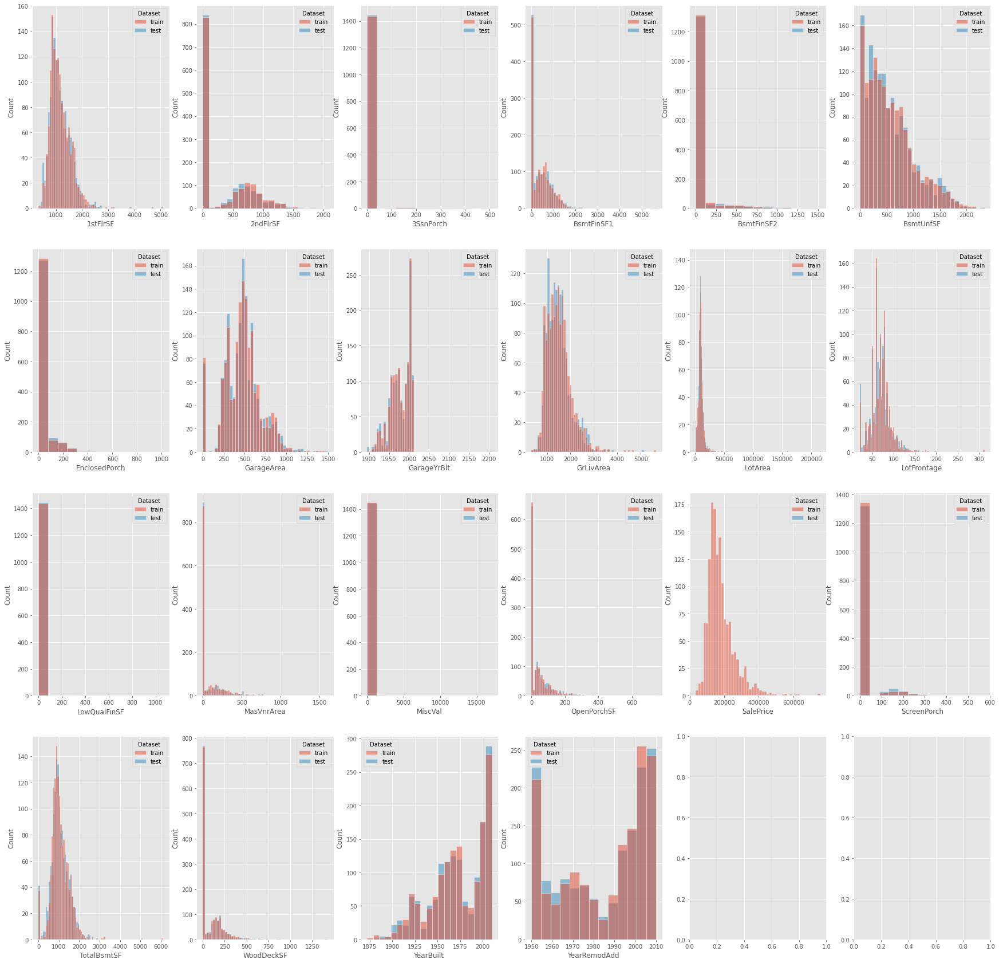

In [492]:
continuous = df.select_dtypes(exclude='object').columns
f, axes = plt.subplots(4,6 , figsize=(30, 30))
axes = iter(axes.reshape(-1))
for feature in sorted(continuous):
    ax = next(axes)
    # ax.set_title(feature)
    sns.histplot(x=feature, data=df, hue="Dataset", ax=ax)

From this plot it is possible to conclude that we have to handle with outliers (e.g. LotArea) and skewed data (e.g. GrLivArea, SalePrice).

Now let's take a look at the linearity of these continuous variables regarding the target SalePrice.

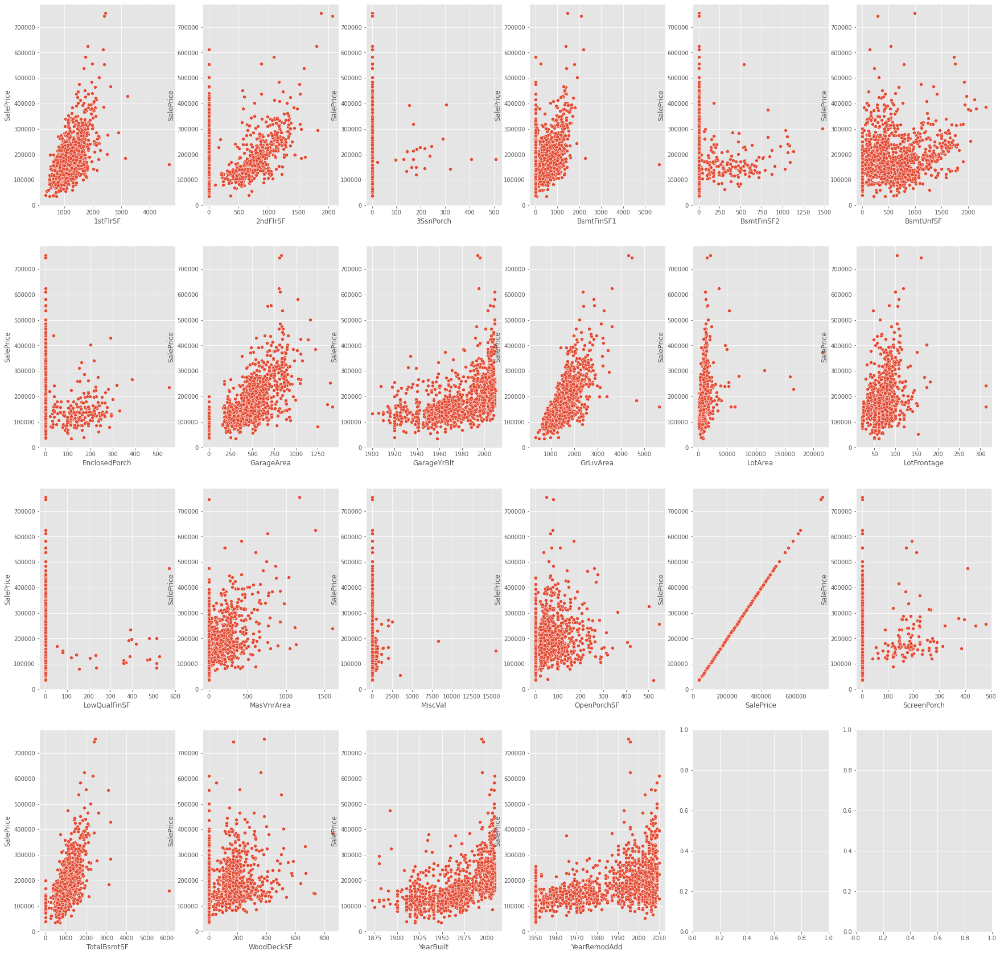

In [493]:
f, axes = plt.subplots(4,6 , figsize=(30, 30))
axes = iter(axes.reshape(-1))
for feature in sorted(continuous):
    ax = next(axes)
    sns.scatterplot( x=feature, y='SalePrice', data=train, ax=ax)

We can notice some interesting positive correlations, even for categorical features. Examples of features that present some liniarity to SalePrice are 1stFlrSF and GrLivArea.

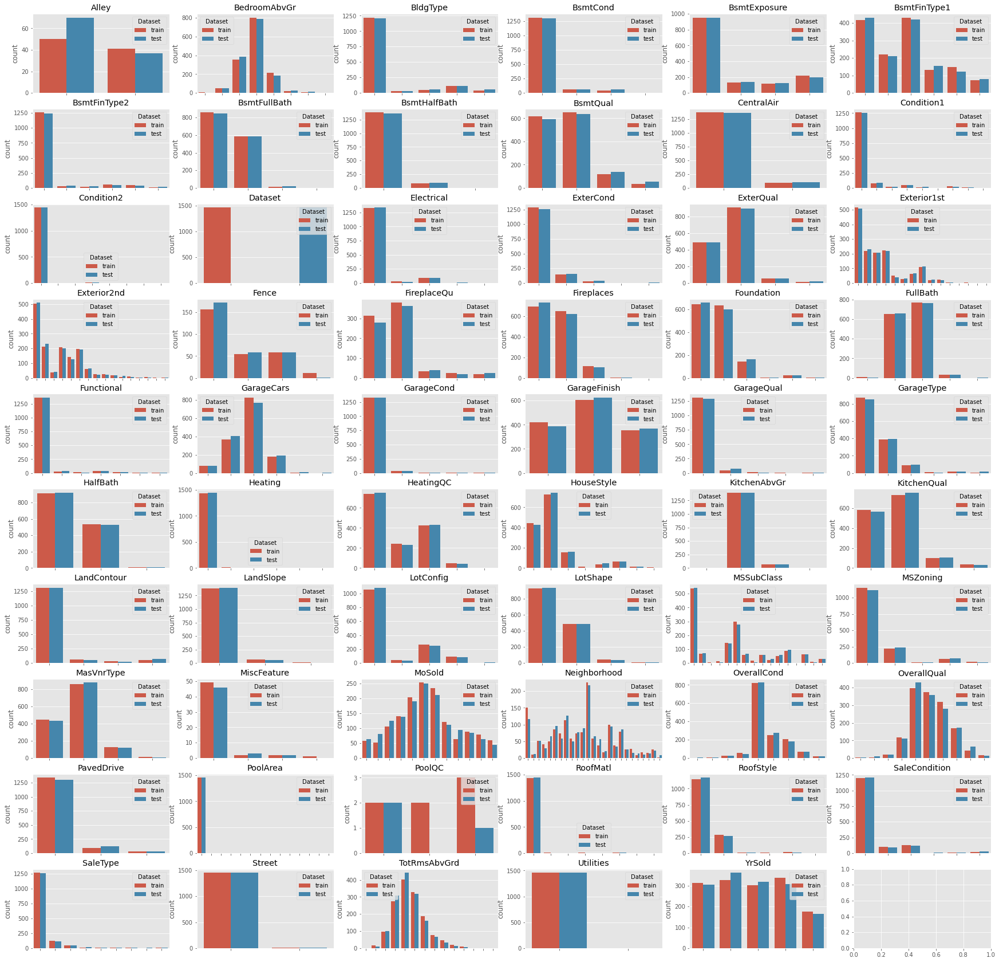

In [494]:
categorical = df.select_dtypes(include='object').columns
f, axes = plt.subplots(10, 6, figsize=(30, 30))
axes = iter(axes.reshape(-1))
for feature in sorted(categorical):
    ax = next(axes)
    sns.countplot(x = feature, data=df, hue="Dataset", ax=ax)
    ax.set_xticklabels([])
    ax.set_xlabel('')
    ax.set_title(feature)

Here we can have some options, such as transform features into binaries, i.e. majority values x minority values (e.g. BsmtExposure), or maybe we should drop features with low variance (e.g. RoofMatl). 

Let's check the distribution of these features according our target SalePrice.

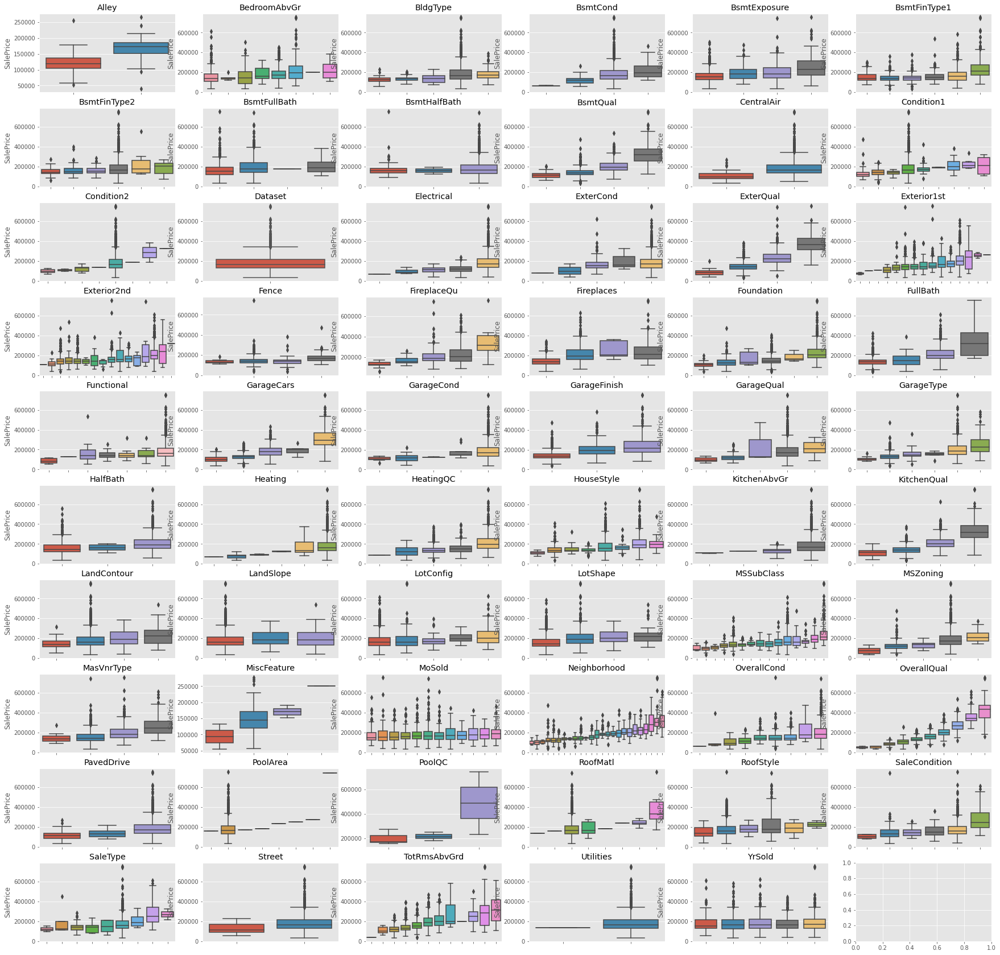

In [495]:
f, axes = plt.subplots(10, 6, figsize=(30, 30))
axes = iter(axes.reshape(-1))
for feature in sorted(categorical):
    ax = next(axes)
    sorting_by_median = sorted(train.groupby(feature)['SalePrice'].median().items(), key=lambda x:x[1])
    order = [x[0] for x in sorting_by_median]
    sns.boxplot(x=feature, y='SalePrice', data=train, order=order, ax=ax)
    ax.set_xticklabels([])
    ax.set_xlabel('')
    ax.set_title(feature)


Here we can notice an interesting linearity for Overallqual, Neighborhood, and KitchenQual.

Also, some features present several outliers, for instance MSSubClass, MoSold, Exterior2nd, and Exterior1st.

Lastly, some features can be transformed into binaries or regrouped according the similarity of values. For the former one, see PoolQC as an example, for the latter one, the Heating features could be grouped into three values only.

### Correlation
Let's first check the most correlated features according the SalePrice. Subsequently, we can check which features could be dropped according the correlation among the entire train set.

In [496]:
# categorical_ = np.append(categorical, 'SalePrice')
# corr_cat = train[categorical_].corr(method='spearman')['SalePrice'].sort_values(ascending=False)
# corr_cat = corr_cat.abs()
# print(corr_cat.head(11))

In [497]:
corr_cat = train[continuous].corr(method='pearson')['SalePrice'].sort_values(ascending=False)
corr_cat = corr_cat.abs()
print(corr_cat.head(11))

SalePrice       1.000000
GrLivArea       0.708624
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
YearBuilt       0.522897
YearRemodAdd    0.507101
GarageYrBlt     0.486362
MasVnrArea      0.477493
BsmtFinSF1      0.386420
LotFrontage     0.351799
Name: SalePrice, dtype: float64


<AxesSubplot:>

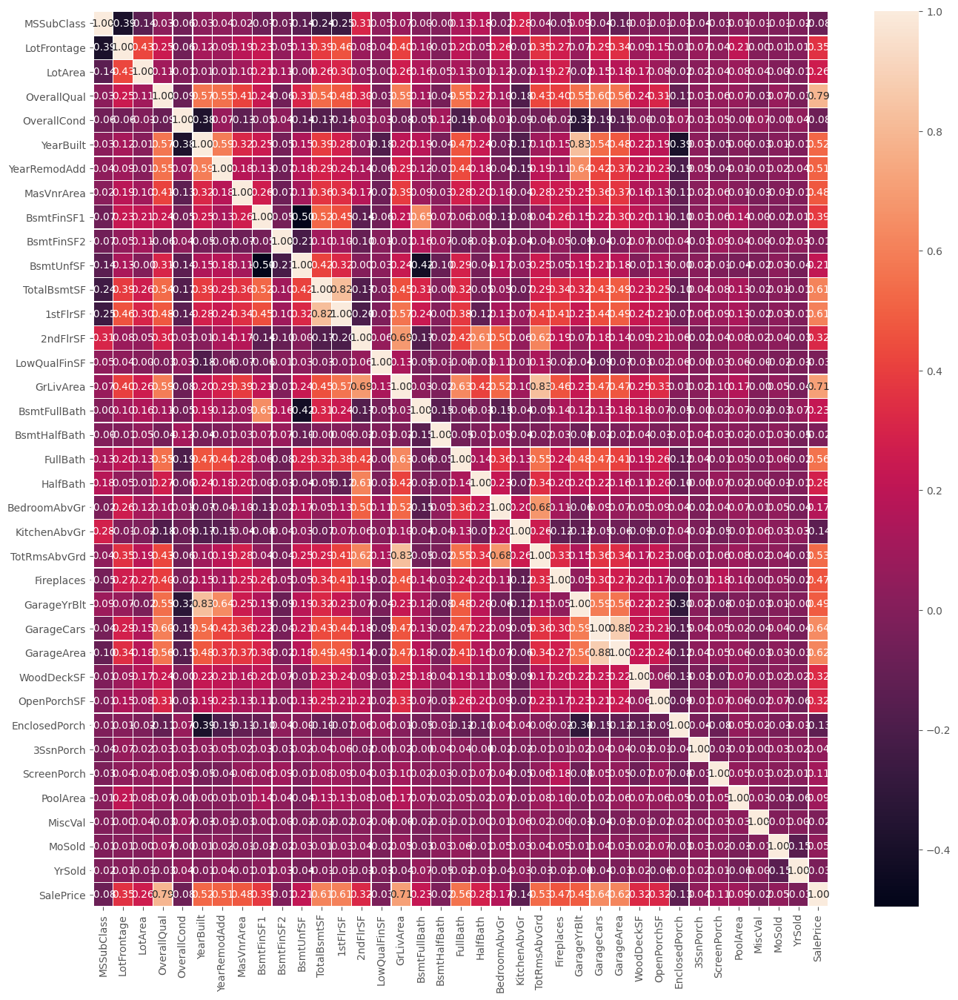

In [498]:
plt.figure(figsize=(16,16), dpi=100)
sns.heatmap(train.corr(), annot=True, fmt='.2f', linewidths=.3)

Negative correlations (< -.35)
- LotFrontage and MSSubClass
- YearBuilt and Overall Cond
- BsmtUnfSF and BsmtFinSF1
- EnclosedPorch x YearBuilt

Positive correlations (>= .65)
- 1stFlrSF x TotalBsmtSF
- GrLivArea x 2ndFlrSF
- BsmtFullBath x BsmtFinSF1
- TotRmsAbvGrd x GrLivArea
- TotRmsAbvGrd x BedroomAbvGr
- GarageYrBlt x YearBuilt
- GarageArea x GarageCars
- SalePrice x OverallQuall, GrLivArea

From the high correlated features, we can drop the least correlated ones w.r.t the SalePrice.

## Preprocessing

- Features to drop:
    - By correlation: 'MSSubClass', 'YearBuilt', 'BsmtUnfSF', '2ndFlrSF', 'BsmtFullBath', 'BedroomAbvGr', 'GarageYearBuilt', 'GarageArea'
    - By missing values: 'PoolQC','MiscFeature','Alley','Fence','FireplaceQu','LotFrontage'

- Features to fill NaNs: 
    - Fist check how to fill (with 0, median, etc)
    - 'GarageYrBlt','GarageFinish','GarageQual','GarageCond','GarageType','BsmtExposure','BsmtFinType2','BsmtCond','BsmtQual','BsmtFinType1','MasVnrType','MasVnrArea','Electrical','MSZoning','Utilities','BsmtFullBath','BsmtHalfBath','Functional','Exterior1st','Exterior2nd','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','KitchenQual','GarageCars','GarageArea','SaleType'

- Features to handle outliers:

- Features to apply log transformation:
    - 'BsmtUnfSF', 'LotFrontage', 'LotArea', '1stFlrSF', 'GrLivArea', 'TotalBsmtSF', 'GarageArea', 'WoodDeckSF'
    
- Features to regroup:
    - to binary: 'PavedDrive', 'HeatingQC', 'HouseStyle', 'LotConfig', 'LotShape', 'RoofStyle', 'RoofMatl'
    - one hot encoding: 'BldgType', 'ExternalQual', 'ExternalCond', 'SaleCondition', 'Condition1', 'LandContour', 'Foundation'

In [75]:
to_fill_na = [
    'GarageFinish','GarageQual','GarageCond','GarageType','BsmtExposure','BsmtFinType2','BsmtCond','BsmtQual','BsmtFinType1',
    'MasVnrType','MasVnrArea','Electrical','MSZoning','Utilities','BsmtHalfBath','Functional','Exterior1st','Exterior2nd',
    'BsmtFinSF1','BsmtFinSF2','TotalBsmtSF','KitchenQual','GarageCars','SaleType', 'LotFrontage'
]

to_fill_with_zero = ['GarageYrBlt', 'GarageArea', 'GarageCars','MasVnrArea','BsmtFinSF1','BsmtFinSF2'
           ,'BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BsmtUnfSF','TotalBsmtSF', 'Total_Bathrooms']

to_log = [
    'LotArea', '1stFlrSF', 'GrLivArea', 'TotalBsmtSF', 'WoodDeckSF', 'MasVnrArea', 'OpenPorchSF', 'BsmtFinSF1', 'BsmtFinSF2', 'LotFrontage'
]

to_binary = {
    'PavedDrive':   [0, 1],              # [2]
    'HeatingQC':    [0],                # [1,2,3,4]
    'HouseStyle':   [0, 1, 4, 6, 7],        # [2, 3,5]
    'LotConfig':    [1, 2, 4],          # [2, 3]
    'LotShape':     [0, 1, 3],            # [2]
    'RoofStyle':    [1, 2, 4, 5],          # [2,3]
    'RoofMatl':     [0, 2, 3, 4, 5, 6],      # [1,7]
}

# 'BldgType':        {0: [1,2,3], 1: [4], 2: [0]}
# 'ExternalQual':    {0: 0, 1: 1, 2: 2, 3: 3}
# 'ExternalCond':    {0: [1, 3], 1: [0], 2: [2, 4]}
# 'SaleCondition':   {0: [0,1,2,3], 1: [4], 2: [5]}
# 'Condition1':      {0: [1, 5, 6], 1: [0, 3, 4, 6, 7, 8], 2: [2]}
# 'LandContour':     {0: [0], 1: [1, 2], 2: [3]}
# 'Foundation':      {0: [0,1], 1: [3,4,5], 2: [2]}

In [76]:
# New features
df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']

#  Adding total bathrooms feature
df['Total_Bathrooms'] = (
    df['FullBath'] + (0.5 * df['HalfBath']) +
    df['BsmtFullBath'] + (0.5 * df['BsmtHalfBath']))

#  Adding total porch sqfootage feature
df['Total_porch_sf'] = (
    df['OpenPorchSF'] + df['3SsnPorch'] +
    df['EnclosedPorch'] + df['ScreenPorch'] +
    df['WoodDeckSF'])

# Filling nan
for col in to_fill_na:
    df[col] = df[col].fillna(value=train[col].mode()[0])

for col in to_fill_with_zero:
    df[col] = df[col].fillna(value=0)

# Categorical encoder
categorical = train.select_dtypes('object').columns.values
df[categorical] = df[categorical].astype(str)
for col in categorical:
    le = LabelEncoder().fit(df.loc[:, col])
    df.loc[:, col] = le.transform(df.loc[:, col])

# To binary
for col, values in to_binary.items():
    df[col] = np.where(
        df[col].isin(values), 0, 1
    )

df.loc[:, 'BldgType'] = df.loc[:, 'BldgType'].map({
    1: 0, 2: 0, 3: 0,
    4: 1,
    0: 2
})

df.loc[:, 'ExterCond'] = df.loc[:, 'ExterCond'].map({
    1: 0, 3: 0,
    0: 1,
    2: 2, 4: 2
})

df.loc[:, 'SaleCondition'] = df.loc[:, 'SaleCondition'].map({
    0: 0, 1: 0, 2: 0, 3: 0,
    4: 1,
    5: 2
})

df.loc[:, 'Condition1'] = df.loc[:, 'Condition1'].map({
    1: 0, 5: 0, 6: 0,
    0: 1, 3: 1, 4: 1, 6: 1, 7: 1, 8: 1,
    2: 2
})

df.loc[:, 'LandContour'] = df.loc[:, 'LandContour'].map({
    0: 0,
    1: 1, 2: 1,
    3: 2
})

df.loc[:, 'Foundation'] = df.loc[:, 'Foundation'].map({
    0: 0, 1: 0,
    3: 1, 4: 1, 5: 1,
    2: 2
})

drop_cols = ['OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'ScreenPorch', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF']
# Dropping
df.drop(drop_cols, axis=1, inplace=True)

# Log transformation
# df.loc[:, to_log] = np.log(df.loc[:, to_log].replace(0, np.nan))
# df.loc[:, to_log] = df.loc[:, to_log].fillna(0)

# Using boxcox instead of log transformation for skewed data
continuous = df.select_dtypes(exclude='object')
from scipy.stats import skew, boxcox_normmax
skewness = continuous.apply(lambda x: skew(x))
skewness = skewness[abs(skewness) > 0.5]

from scipy.special import boxcox1p
skewed_features = skewness.index
for col in skewed_features:
    continuous[col] = boxcox1p(continuous[col], boxcox_normmax(continuous[col] + 1))
    df[col] = boxcox1p(df[col], boxcox_normmax(df[col] + 1))

df['TotalSF'] = df['TotalSF'].fillna(value=df['TotalSF'].mode()[0])
df = pd.get_dummies(df) #.reset_index(drop=True)

In [78]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler, StandardScaler

X_train = df[df.Dataset == 1]
y_train = X_train['SalePrice'].apply(np.log1p)
X_train.drop(['SalePrice', 'Dataset'], axis=1, inplace=True)
X_test = df[df.Dataset == 0]
X_test.drop(['SalePrice', 'Dataset'], axis=1, inplace=True)

pipeline = make_pipeline(VarianceThreshold(0.001), RobustScaler())

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

X_train.shape[1] == X_test.shape[1]

True

## Learning phase

In [35]:
RANDOM_SEED = 42
kfolds = KFold(n_splits=10, shuffle=True, random_state=RANDOM_SEED)

def tune(objective):
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=100)

    params = study.best_params
    best_score = study.best_value
    print(f"Best score: {best_score} \nOptimized parameters: {params}")
    return params

def lasso_objective(trial):

    _alpha = trial.suggest_float("alpha", 0.0001, 1)

    lasso = Lasso(alpha=_alpha, random_state=RANDOM_SEED)

    score = cross_val_score(
        lasso, X_train, y_train, cv=kfolds, scoring="neg_root_mean_squared_error"
    ).mean()
    return score

def elasticnet_objective(trial):

    _alpha = trial.suggest_float("alpha", 0.0001, 1)
    _l1_ratio = trial.suggest_float("l1_ratio", 0.01, 1)

    elastic = ElasticNet(alpha=_alpha, l1_ratio=_l1_ratio, random_state=RANDOM_SEED)

    score = cross_val_score(
        elastic, X_train, y_train, cv=kfolds, scoring="neg_root_mean_squared_error"
    ).mean()
    return score

def randomforest_objective(trial):
    _n_estimators = trial.suggest_int("n_estimators", 50, 200)
    _max_depth = trial.suggest_int("max_depth", 5, 20)
    _min_samp_split = trial.suggest_int("min_samples_split", 2, 10)
    _min_samples_leaf = trial.suggest_int("min_samples_leaf", 2, 10)
    _max_features = trial.suggest_int("max_features", 10, 50)

    rf = RandomForestRegressor(
        max_depth=_max_depth,
        min_samples_split=_min_samp_split,
        min_samples_leaf=_min_samples_leaf,
        max_features=_max_features,
        n_estimators=_n_estimators,
        n_jobs=-1,
        random_state=RANDOM_SEED,
    )

    score = cross_val_score(
        rf, X_train, y_train, cv=kfolds, scoring="neg_root_mean_squared_error"
    ).mean()
    return score

def gbr_objective(trial):
    _n_estimators = trial.suggest_int("n_estimators", 50, 2000)
    _learning_rate = trial.suggest_float("learning_rate", 0.01, 1)
    _max_depth = trial.suggest_int("max_depth", 1, 20)
    _min_samp_split = trial.suggest_int("min_samples_split", 2, 20)
    _min_samples_leaf = trial.suggest_int("min_samples_leaf", 2, 20)
    _max_features = trial.suggest_int("max_features", 10, 50)

    gbr = GradientBoostingRegressor(
        n_estimators=_n_estimators,
        learning_rate=_learning_rate,
        max_depth=_max_depth, 
        max_features=_max_features,
        min_samples_leaf=_min_samples_leaf,
        min_samples_split=_min_samp_split,
        
        random_state=RANDOM_SEED,
    )

    score = cross_val_score(
        gbr, X_train, y_train, cv=kfolds, scoring="neg_root_mean_squared_error"
    ).mean()
    return score

In [99]:
gbr_params = tune(gbr_objective)
randomforest_params = tune(randomforest_objective)
elasticnet_params = tune(elasticnet_objective)
lasso_params = tune(lasso_objective)

est is trial 69 with value: -0.13660979773667797.
[I 2021-02-28 11:26:00,614] Trial 91 finished with value: -0.16512754169481764 and parameters: {'alpha': 0.025287302977322873, 'l1_ratio': 0.5292063924281105}. Best is trial 69 with value: -0.13660979773667797.
[I 2021-02-28 11:26:00,858] Trial 92 finished with value: -0.19507085146147873 and parameters: {'alpha': 0.06126768320312366, 'l1_ratio': 0.6643347053955717}. Best is trial 69 with value: -0.13660979773667797.
[I 2021-02-28 11:26:02,310] Trial 93 finished with value: -0.13872925028516683 and parameters: {'alpha': 0.00024115324297108924, 'l1_ratio': 0.5765973253188434}. Best is trial 69 with value: -0.13660979773667797.
[I 2021-02-28 11:26:02,633] Trial 94 finished with value: -0.17307967568937294 and parameters: {'alpha': 0.040099353067325205, 'l1_ratio': 0.4761439350058102}. Best is trial 69 with value: -0.13660979773667797.
[I 2021-02-28 11:26:02,864] Trial 95 finished with value: -0.16782676003584654 and parameters: {'alpha': 

In [67]:
elasticnet_params = {'alpha': 0.001315192386470104, 'l1_ratio': 0.38447639766100306}
elasticnet = ElasticNet(**elasticnet_params, random_state=RANDOM_SEED)
elasticnet.fit(X_train, y_train)

randomforest_params = {'n_estimators': 137, 'max_depth': 17, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 23}
rf = RandomForestRegressor(n_jobs=-1, random_state=RANDOM_SEED, **randomforest_params)
rf.fit(X_train, y_train)

gbr_params = {'n_estimators': 1568, 'learning_rate': 0.04036478067352787, 'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 2, 'max_features': 32}
gbr = GradientBoostingRegressor(random_state=RANDOM_SEED, **gbr_params)
gbr.fit(X_train, y_train)

lasso_params = {'alpha': 0.0004870959682148648}
lasso = Lasso(random_state=RANDOM_SEED, **lasso_params)
lasso.fit(X_train, y_train)

Lasso(alpha=0.0004870959682148648, random_state=42)

In [72]:
# stack = StackingRegressor(
#     estimators=[
#         ('Lasso', lasso),
#         ('elasticnet', elasticnet),
#         ('randomforest', rf),
#         ('gradientboostingregressor', gbr),
#     ],
#     cv=kfolds)
# stack.fit(X_train, y_train)

StackingRegressor(cv=KFold(n_splits=10, random_state=42, shuffle=True),
                  estimators=[('Lasso',
                               Lasso(alpha=0.0004870959682148648,
                                     random_state=42)),
                              ('elasticnet',
                               ElasticNet(alpha=0.001315192386470104,
                                          l1_ratio=0.38447639766100306,
                                          random_state=42)),
                              ('randomforest',
                               RandomForestRegressor(max_depth=17,
                                                     max_features=23,
                                                     min_samples_leaf=2,
                                                     n_estimators=137,
                                                     n_jobs=-1,
                                                     random_state=42)),
                              ('gradientboostingregres

Lasso score: 0.1385 (0.0317)

Elastic Net score: 0.1384 (0.0318)

Random Forest score: 0.1329 (0.0225)

Gradient Boosting score: 0.1185 (0.0204)

Stacking score: 0.1206 (0.0253)



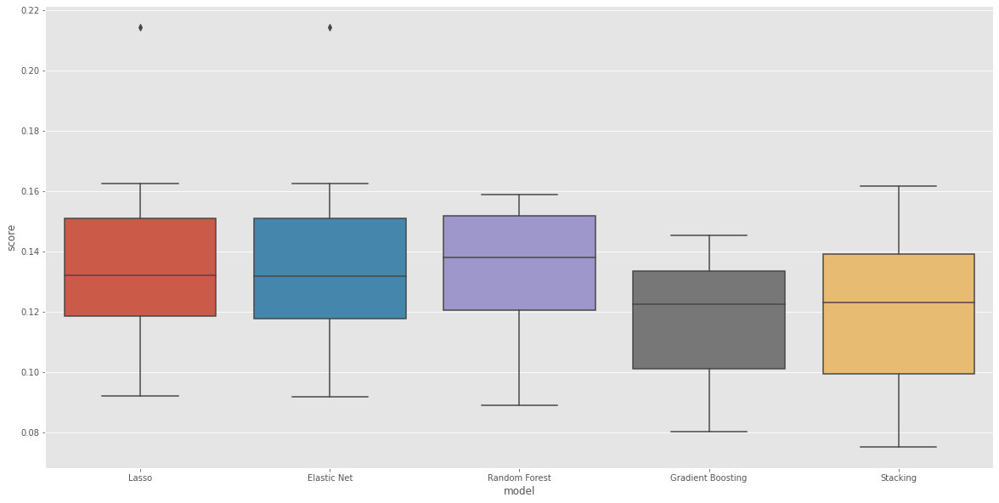

In [73]:
def cv_rmse(model):
    rmse = -cross_val_score(model, X_train, y_train,
                            scoring="neg_root_mean_squared_error",
                            cv=kfolds)
    return (rmse)

def compare_models():
    models = {
        # 'Ridge': ridge,
        'Lasso': lasso,
        'Elastic Net': elasticnet,
        'Random Forest': rf,
        'Gradient Boosting': gbr,
        # 'Stacking': stack, 
    }

    scores = pd.DataFrame(columns=['score', 'model'])

    for name, model in models.items():
        score = cv_rmse(model)
        print("{:s} score: {:.4f} ({:.4f})\n".format(name, score.mean(), score.std()))
        df = pd.Series(score, name='score').to_frame()
        df['model'] = name
        scores = scores.append(df)

    plt.figure(figsize=(20,10))
    sns.boxplot(data = scores, x = 'model', y = 'score')
    plt.show()
    
compare_models()

In [74]:
test['SalePrice'] = np.expm1(
    0.4* gbr.predict(X_test) +
    0.2 * lasso.predict(X_test) +
    0.2 * elasticnet.predict(X_test) +
    0.2 * rf.predict(X_test)
)
test.reset_index(inplace=True)
test[['Id', 'SalePrice']].to_csv('/home/seidi/Repositories/kaggle_projects/house_prices/predictions.csv', index=False)